In [1]:
from scipy.io import wavfile
rate, x = wavfile.read('pirates-of-the-caribean.wav')
aud = x[:,0]

NameError: name 'aud' is not defined

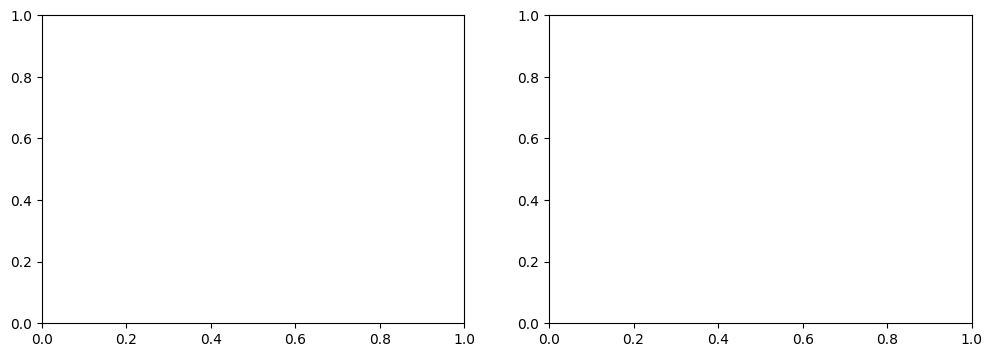

In [1]:
%matplotlib inline
from matplotlib import pyplot as plt
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
ax1.plot(aud); ax1.set_title('Raw audio signal')
first = aud[int(rate*0):int(rate*150)]
ax2.specgram(first, Fs=rate); ax2.set_title('Spectrogram')
# plt.ylim(000,7000)
# plt.xlim(0,5)

In [4]:
import scipy.io.wavfile
import scipy.signal
import numpy as np
import matplotlib.pyplot as plt

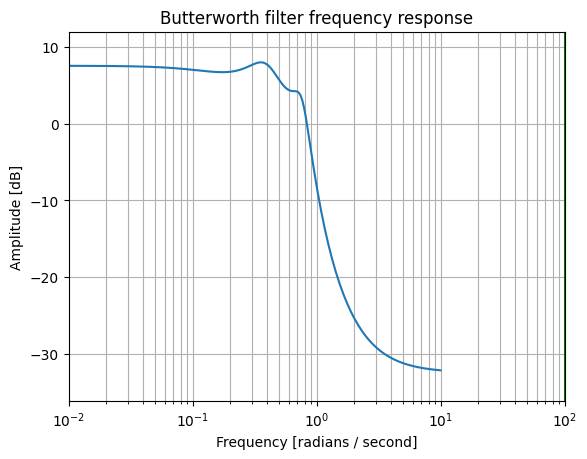

In [53]:
lowcut=1000
highcut=10000

nyq = 0.5 * rate
low = lowcut / nyq
high = highcut / nyq

b, a = scipy.signal.butter(5, [low, high], 'band')

w, h = scipy.signal.freqs(b, a)

plt.semilogx(w, 20 * np.log10(abs(h)))

plt.title('Butterworth filter frequency response')

plt.xlabel('Frequency [radians / second]')

plt.ylabel('Amplitude [dB]')

plt.margins(0, 0.1)

plt.grid(which='both', axis='both')

plt.axvline(100, color='green') # cutoff frequency

plt.show()

In [101]:
# UNDERSTAND HOW THE FILTER WORKS

lowcut=65.4
highcut=900

nyq = 0.5 * rate
low = lowcut / nyq
high = highcut / nyq

b, a = scipy.signal.butter(6, [low, high], 'band') #arguments: 01 - , 02 - , 03 - type of filter
filteredBandPass = scipy.signal.lfilter(b, a, aud)



In [11]:
import numpy as np
import IPython

IPython.display.Audio(filteredBandPass, rate=rate)

Text(0.5, 1.0, 'Spectrogram')

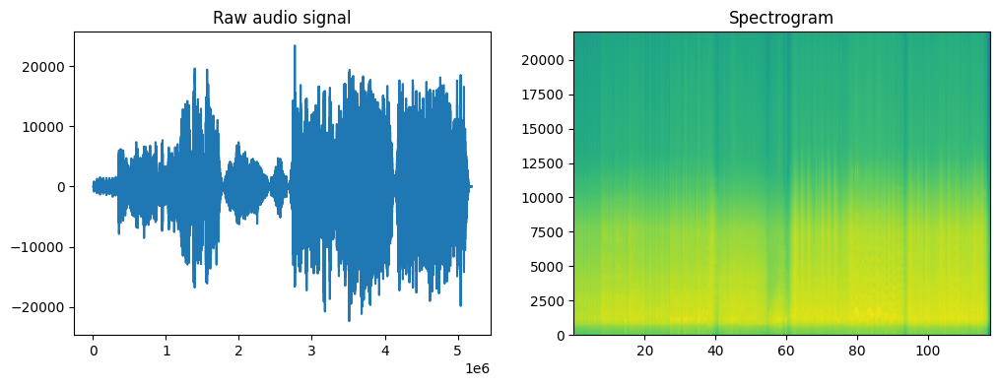

In [10]:
%matplotlib inline

lowcut=1000
highcut=7500
filteredBandPass = butter_bandpass_filter(aud, lowcut, highcut, rate, order=9)

from matplotlib import pyplot as plt
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
second = filteredBandPass[int(rate*0):int(rate*150)]
ax1.plot(second); ax1.set_title('Raw audio signal')
ax2.specgram(second, Fs=rate); ax2.set_title('Spectrogram')

(10.0, 15.0)

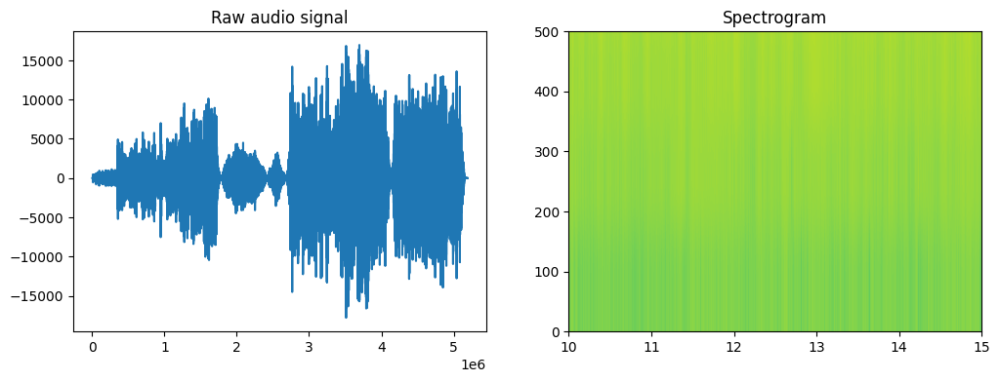

In [28]:
%matplotlib inline
from matplotlib import pyplot as plt
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
second = filteredBandPass[int(rate*0):int(rate*150)]
ax1.plot(second); ax1.set_title('Raw audio signal')
ax2.specgram(second, Fs=rate); ax2.set_title('Spectrogram')
plt.ylim(0,500)
plt.xlim(10,15)

In [15]:
# SEARCH FOR CODE ON HOW TO CREATE A WAVE FILE

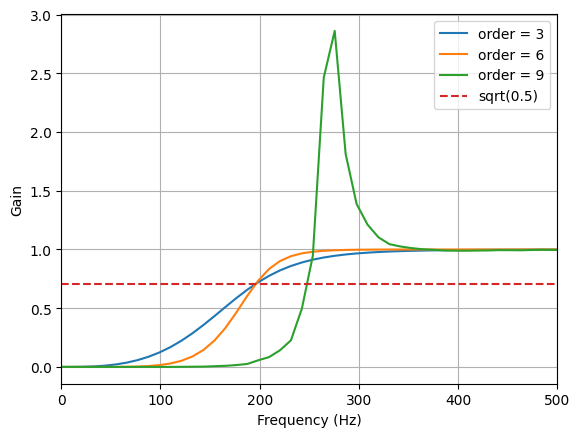

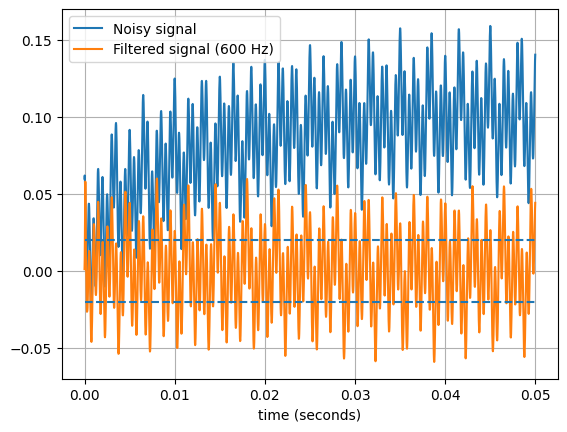

In [6]:
from scipy.signal import butter, lfilter

def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a


def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y


def run():
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.signal import freqz

    # Sample rate and desired cutoff frequencies (in Hz).
    fs = rate
    lowcut = 196.0
    highcut = 10000.0

    # Plot the frequency response for a few different orders.
    plt.figure(1)
    plt.clf()
    for order in [3, 6, 9]:
        b, a = butter_bandpass(lowcut, highcut, fs, order=order)
        w, h = freqz(b, a, worN=2000)
        plt.plot((fs * 0.5 / np.pi) * w, abs(h), label="order = %d" % order)

    plt.plot([0, 0.5 * fs], [np.sqrt(0.5), np.sqrt(0.5)],
             '--', label='sqrt(0.5)')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Gain')
    plt.grid(True)
    plt.legend(loc='best')
    plt.xlim(0,500)

    # Filter a noisy signal.
    T = 0.05
    nsamples = int(T * fs)
    t = np.linspace(0, T, nsamples, endpoint=False)
    a = 0.02
    f0 = 600.0
    x = 0.1 * np.sin(2 * np.pi * 1.2 * np.sqrt(t))
    x += 0.01 * np.cos(2 * np.pi * 312 * t + 0.1)
    x += a * np.cos(2 * np.pi * f0 * t + .11)
    x += 0.03 * np.cos(2 * np.pi * 2000 * t)
    plt.figure(2)
    plt.clf()
    plt.plot(t, x, label='Noisy signal')

    y = butter_bandpass_filter(x, lowcut, highcut, fs, order=6)
    plt.plot(t, y, label='Filtered signal (%g Hz)' % f0)
    plt.xlabel('time (seconds)')
    plt.hlines([-a, a], 0, T, linestyles='--')
    plt.grid(True)
    plt.axis('tight')
    plt.legend(loc='upper left')

    plt.show()


run()